<a href="https://colab.research.google.com/github/renatadecassiapires/YOLOv8_OpenCV_CLI/blob/main/YOLOv8_CLI_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Há duas possibilidades para instalar a Yolov8:


1.   Clonando o repositório como visto no código abaixo
2.   Ou via pip install (opção escolhida - ver a partir do item 2)




In [ ]:
# código para clonar via git hub
# !git clone https://github.com/ultralytics
# !pip install -r requirements.txt
# !pip install -qe ultralytics

# 2. Instalar e configurar a YOLOv8 via pip install

In [1]:
# realizar a instalação do programa yoov8 desenvovido pela ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.2/663.2 kB 8.0 MB/s eta 0:00:00


In [2]:
# após instalação, realizar a importação de todas as funções referentes a yolov8
import ultralytics

In [3]:
# para verificar versão instalada, executar o código abaixo:
ultralytics.checks()

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/107.7 GB disk)


In [4]:
# para verificar se GPU está ativa - caso sim, a resposta será True
import torch
torch.cuda.is_available()

False

In [5]:
# para obter maiores informações sobre a GPU
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


# 3. Importar demais bibliotecas necessárias ao projeto

In [6]:
import cv2 #openCV
import matplotlib.pyplot as plt # para visualização gráfica
import os # pata termos acesso aos recursos operacionais do sistema
from PIL import Image
from google.colab.patches import cv2_imshow # para visualizar as imagens

# 4. Treinamento do modelo - detecção de imagem



1.   Detecção via CLI - linha de comando
2.   Parâmetros do código:
3.   task - tarefa, podendo ser detecção, segmentação ou classificação
4.   model - o modelo que queremos usar. São disponibilizados 5 modelos: YOLOv8n (nano), YOLOv8s (small), YOLOv8m (medium), YOLOv8l (large), YOLOv8x (extra large). Nano é o mais rápido e o menor (menos pesado para rodar), enquanto que o Extra Large (YOLOv8x) é o mais preciso porém mais pesado para rodar, portanto será mais lento. Para o valor desse parâmetro, basta informar o nome e ao lado .pt pois é a extensão do modelo treinado em pytorch.
5.   mode - basicamente é o que queremos com o comando. queremos fazer a detecção/inferência/predição, portanto deixe =predict. Valores aceitos: [train, val, predict, export]
6.   conf - o limiar (threshold) que usaremos para filtrar detecções "fracas". Se a confiança estiver abaixo desse valor, não será considerada. Por padrão podemos configurar com um limiar bem baixo (ex: 0.25) e depois aumentar, caso verifique que detectou incorretamente algum objeto.
7.   source - a imagem ou vídeo que queremos fazer a detecção.

In [7]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/vaquinhas.jpg' save=True

100% 6.23M/6.23M [00:00<00:00, 244MB/s]
Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/vaquinhas.jpg: 480x640 3 cows, 261.5ms
Speed: 18.1ms preprocess, 261.5ms inference, 28.2ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


# 4.1 Função para mostrar as imagens detectadas na etapa anterior

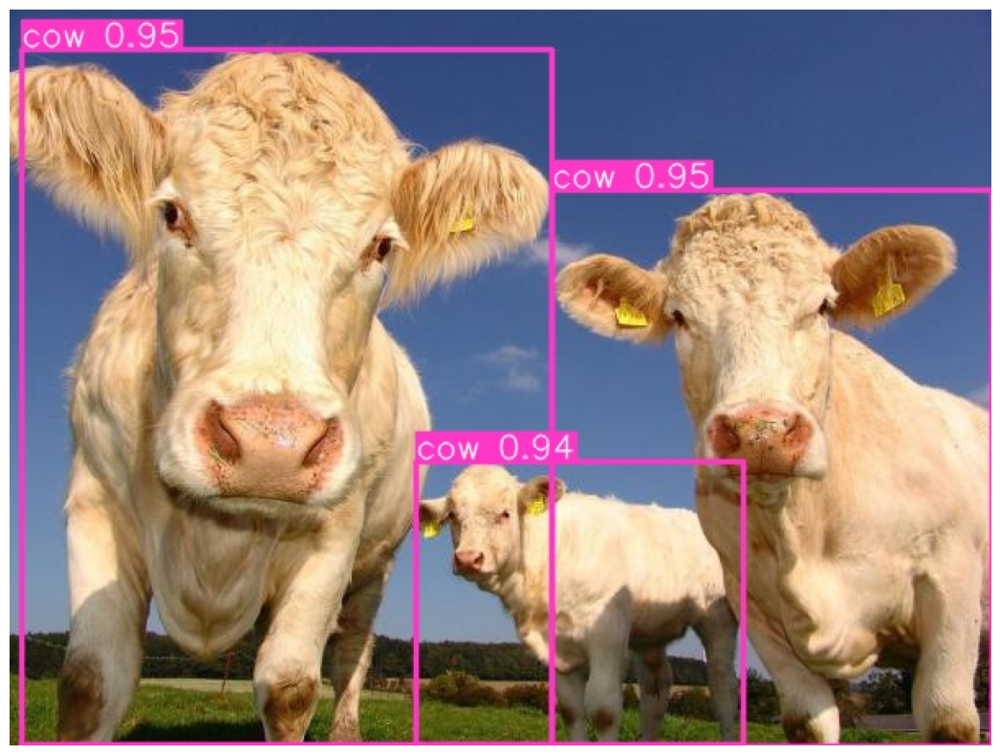

In [11]:
# criação da função para mostrar as imagens geradas
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16,10)
  plt.axis('off')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()
resultado = cv2.imread('/content/runs/detect/predict/vaquinhas.jpg')
mostrar(resultado)


# 5. Alterar o limiar de confiança - valor de threshold


> conf = limiar que define quão confiante a detecção deve ser para ser considerada válida;

> valor de conf mais alto significa que apenas detecções com uma pontuação de confiança maior ou igual a esse limiar serão usadas para calcular a perda durante o treinamento. Isso permite que o modelo se concentre em aprender a localizar e classificar objetos com confiança;

> valor de conf mais baixo permitirá que o modelo considere detecções com pontuações de confiança mais baixas. Isso pode ser útil para detectar objetos que podem ser mais difíceis de identificar, mas também aumenta o risco de detecções incorretas;

> valores mais altos de conf tendem a resultar em detecções mais precisas, enquanto valores mais baixos podem aumentar o recall, detectando mais objetos, mas com maior probabilidade de falsos positivos;

> a escolha do valor de conf depende do seu conjunto de dados, da qualidade das anotações e dos requisitos específicos do seu aplicativo. É comum experimentar com diferentes valores de conf durante o treinamento para encontrar a configuração que atenda melhor às necessidades do seu caso de uso específico.





In [17]:
# teste com valor de confiança 0.4
!yolo task=detect mode=predict model=yolov8n.pt conf=0.4 source='/content/italia.jpg' save=True

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/italia.jpg: 512x640 11 persons, 1 bicycle, 1 handbag, 3 clocks, 246.2ms
Speed: 7.7ms preprocess, 246.2ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


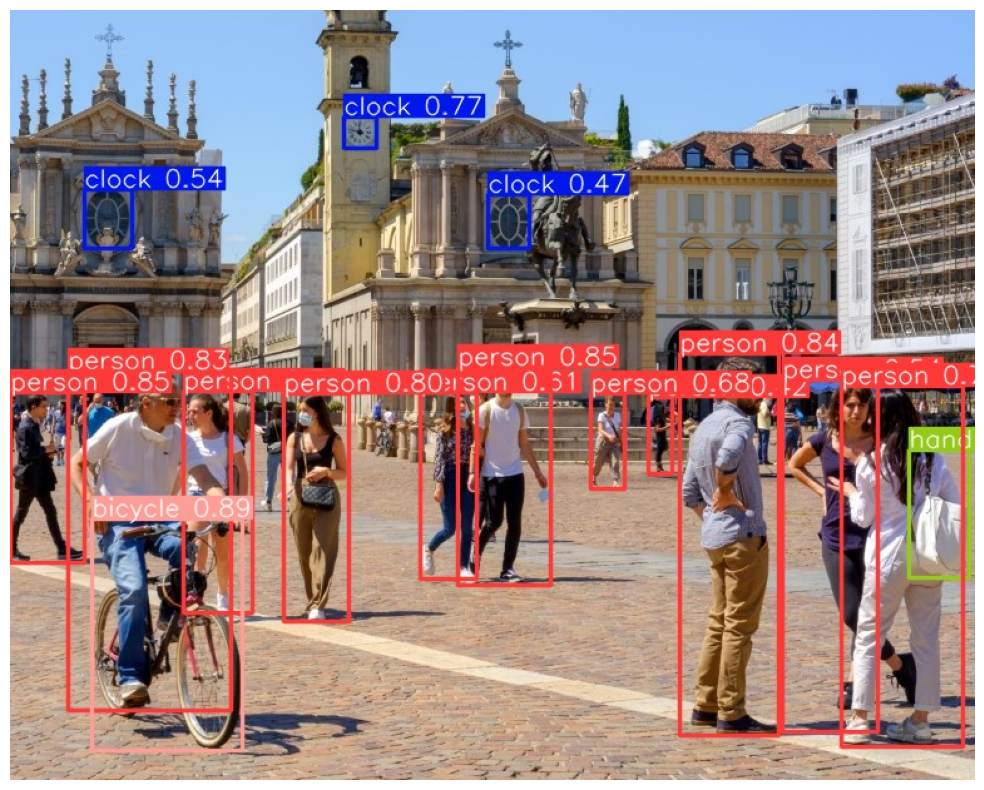

In [18]:
# resultado corrida1 conf=0.4
resultado = cv2.imread('/content/runs/detect/predict4/italia.jpg')
mostrar(resultado)

In [19]:
# teste com valor de confiança 0.6
!yolo task=detect mode=predict model=yolov8n.pt conf=0.6 source='/content/italia.jpg' save=True

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/italia.jpg: 512x640 9 persons, 1 bicycle, 1 clock, 233.0ms
Speed: 7.6ms preprocess, 233.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


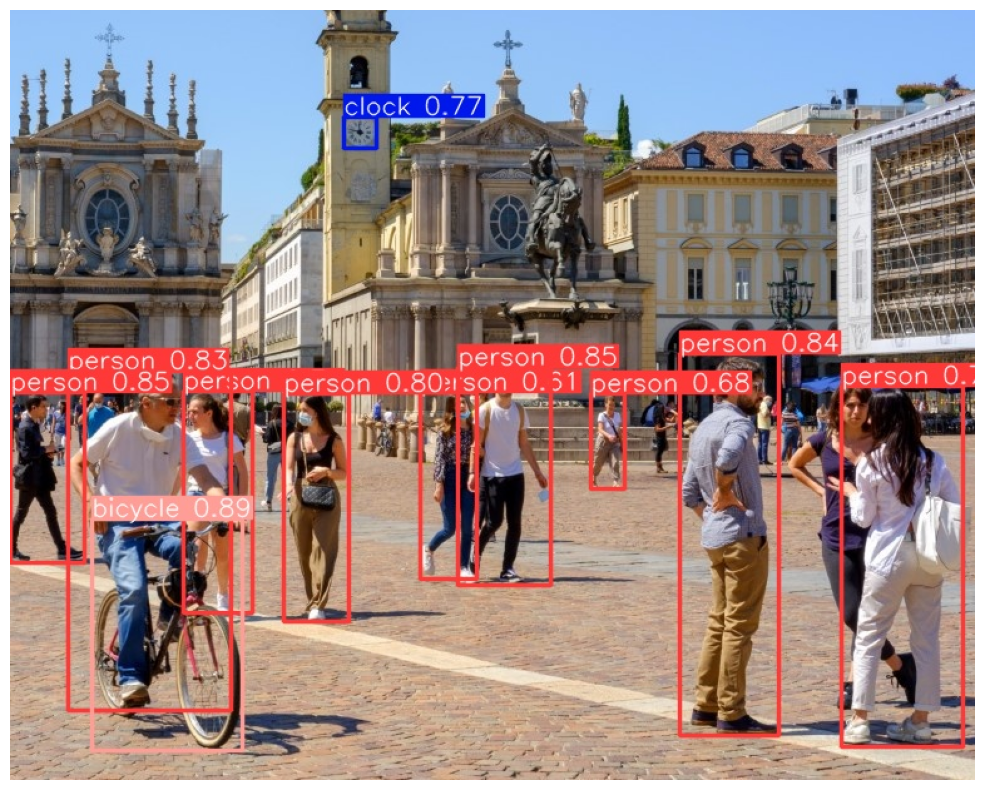

In [20]:
# resultado corrida1 conf=0.6
resultado = cv2.imread('/content/runs/detect/predict5/italia.jpg')
mostrar(resultado)

# 6. Detecção de múltiplas imagens


1.   criar um diretório no drive com todas as imagens;
2.   realizar a deteclção da mesma maneira, mas substituir a source pelo caminho do diretório.




In [21]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.5 source='/content/imagens' save=True

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/7 /content/imagens/cachorros.jpg: 448x640 3 dogs, 424.7ms
image 2/7 /content/imagens/cachorros02.jpg: 448x640 2 dogs, 244.0ms
image 3/7 /content/imagens/dog.jpg: 480x640 1 bicycle, 1 car, 1 truck, 1 dog, 259.0ms
image 4/7 /content/imagens/img-canecas.jpg: 480x640 6 cups, 1 dining table, 235.7ms
image 5/7 /content/imagens/italia.jpg: 512x640 10 persons, 1 bicycle, 2 clocks, 256.5ms
image 6/7 /content/imagens/vacas2.jpg: 448x640 3 cows, 222.7ms
image 7/7 /content/imagens/vaquinhas.jpg: 480x640 3 cows, 240.5ms
Speed: 5.5ms preprocess, 269.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


['/content/runs/detect/predict6/cachorros.jpg', '/content/runs/detect/predict6/vaquinhas.jpg', '/content/runs/detect/predict6/dog.jpg', '/content/runs/detect/predict6/img-canecas.jpg', '/content/runs/detect/predict6/cachorros02.jpg', '/content/runs/detect/predict6/italia.jpg', '/content/runs/detect/predict6/vacas2.jpg']


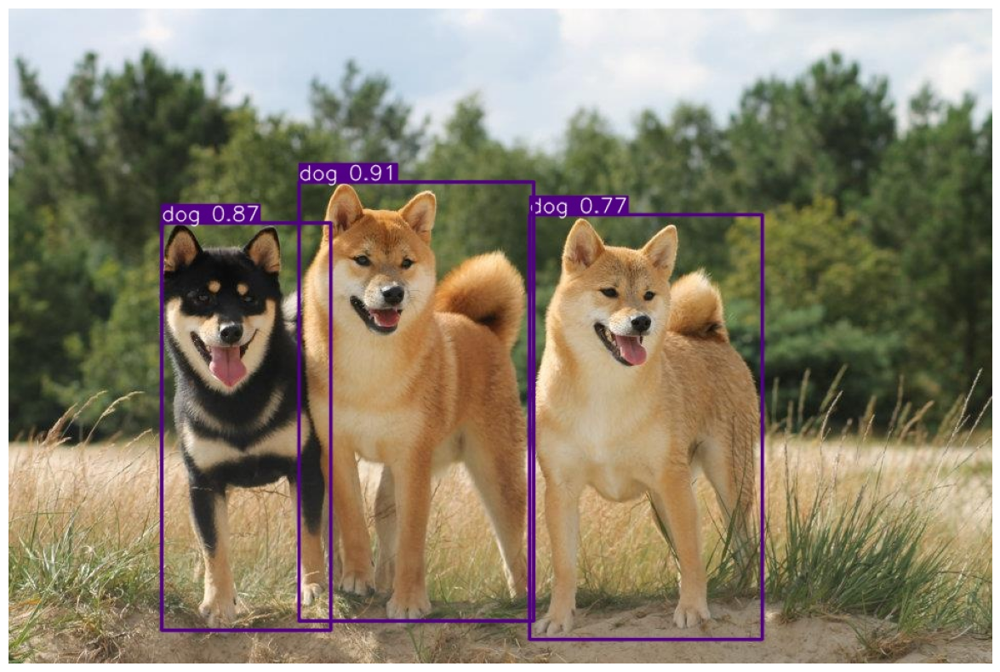

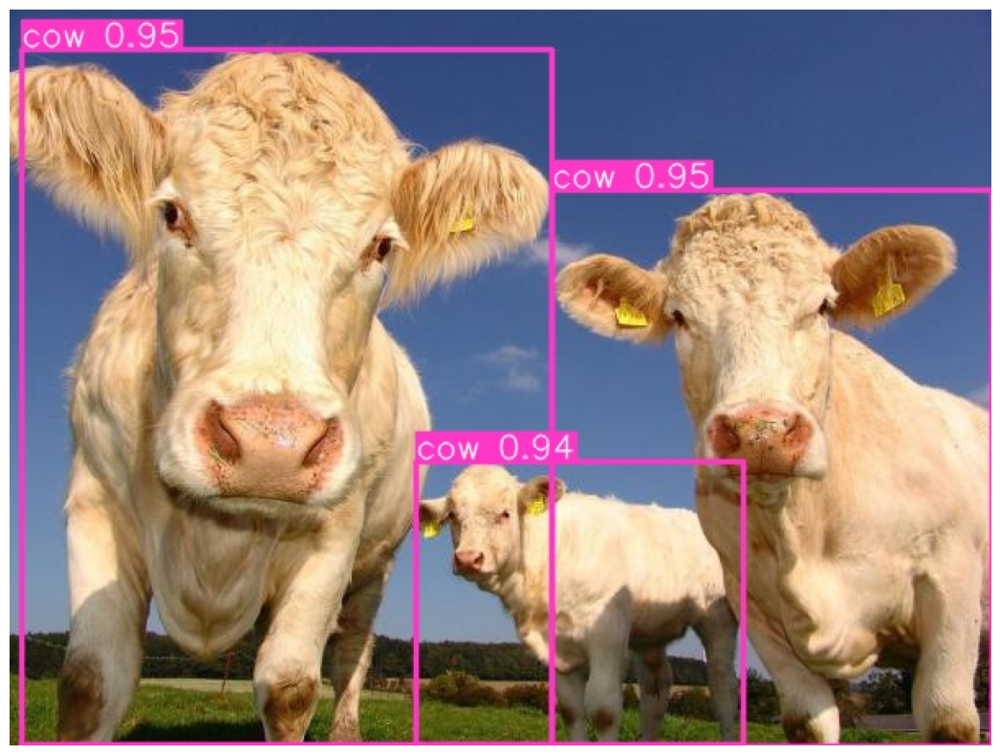

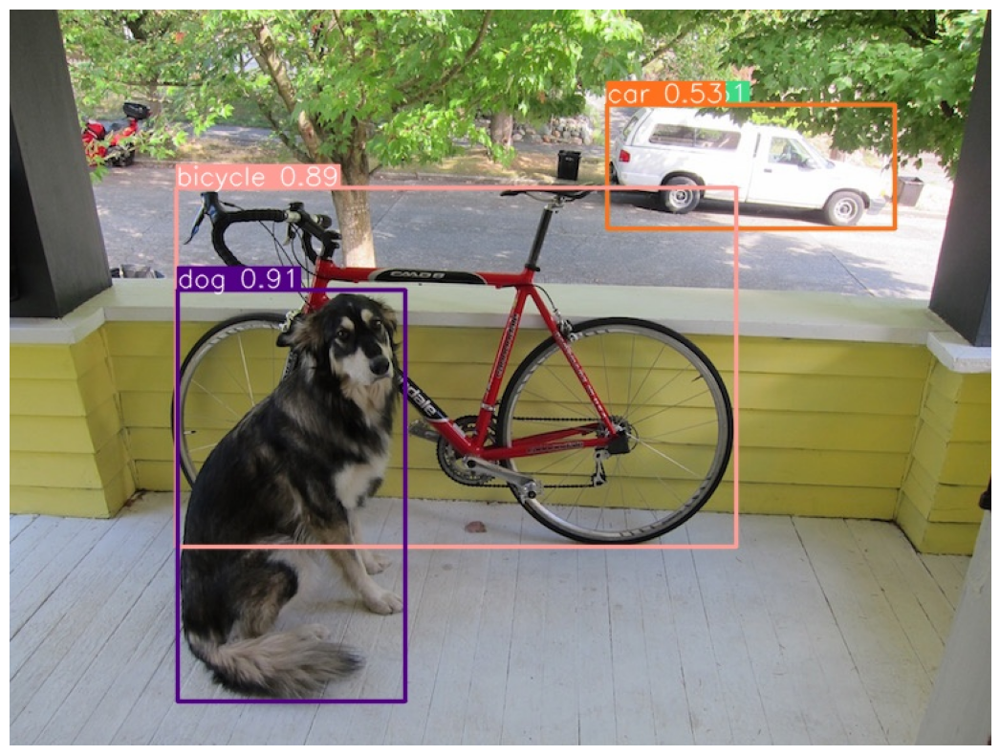

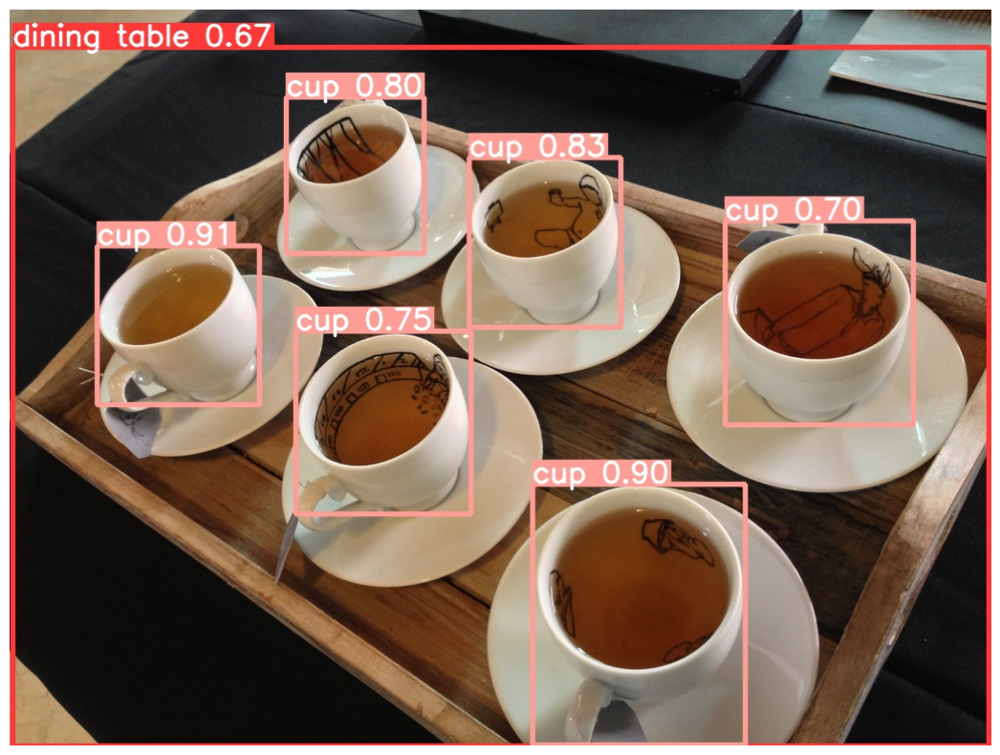

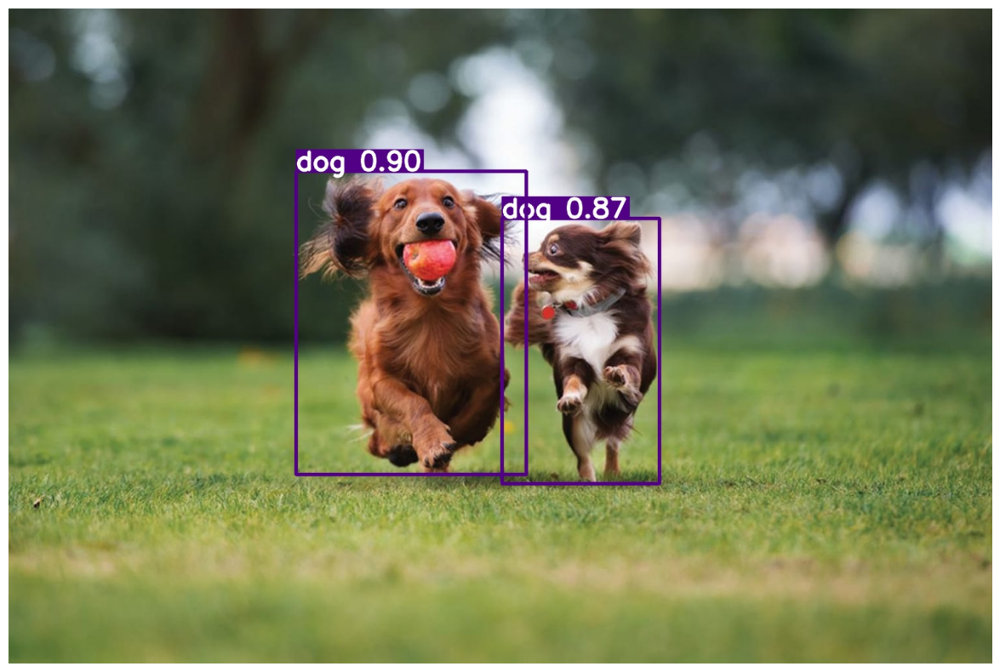

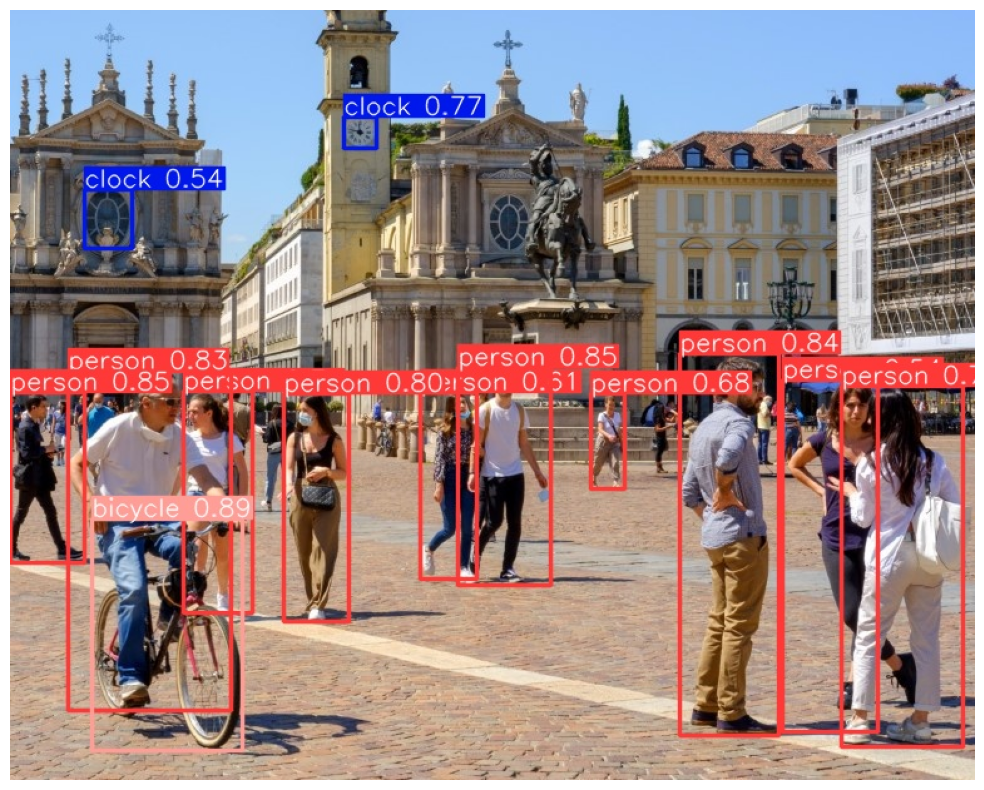

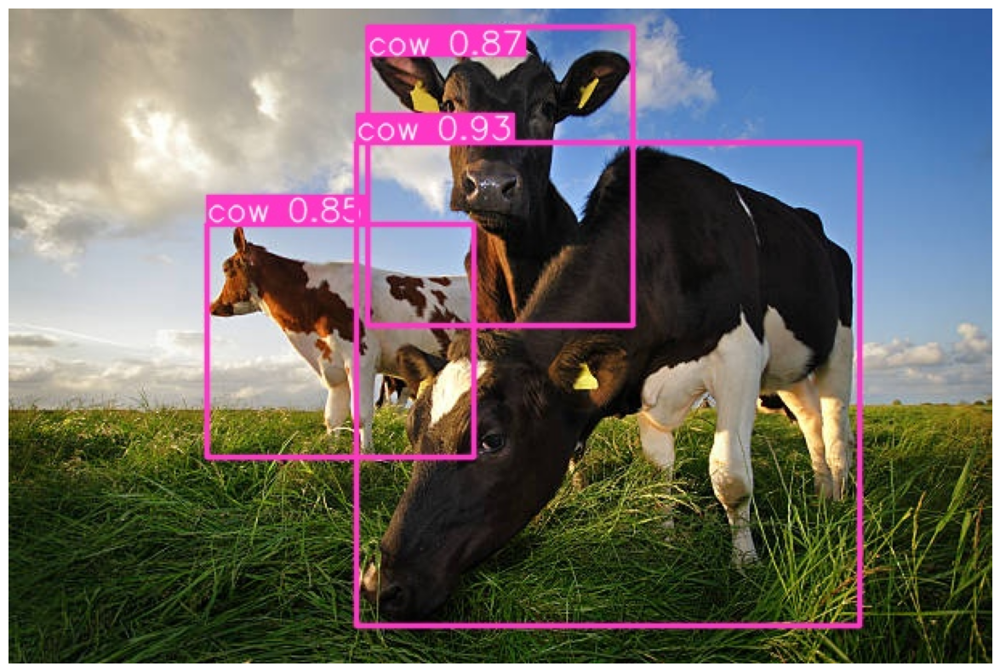

In [22]:
# resultado da detecção da lista de imagens;
# criar variável dir_resultados que vai se associar com o path do resultado gerado
# lembrar que todos os resultados são salvos na pasta run >> detect >> predict
# criar variável caminhos que chama uma lista de arquivos do diretório dir_resultados
# resultado gerado será uma lista com o caminho absoluto de cada arquivo
dir_resultados = '/content/runs/detect/predict6'
caminhos = [os.path.join(dir_resultados, f) for f in os.listdir(dir_resultados)]
print(caminhos)

# feito isso, gerar um for que percorre todos os caminhos das imagens da lista caminhos = []
# openCV (cv2) usado para ler a imagem do arquivo especificado pelo caminho_imagem e armazená-la na variável imagem
# mostrar(imagem) usado para chamar a função mostrar, que passa a imagem como argumento.

for caminho_imagem in caminhos:
  #print(caminho_imagem)
  imagem = cv2.imread(caminho_imagem)
  mostrar(imagem)

# 7. Validação do modelo

1.   Utilizar um banco de dados já conhecido para validar o modelo




In [23]:
import torch # importar biblioteca Pytorch
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip') # fazer download do banco de dados coco2017

100%|██████████| 780M/780M [00:10<00:00, 78.5MB/s]


In [24]:
# código para descompactar dataset baixado e retirar arquivo .zip
# em content >> dataset >> coco

!unzip -q tmp.zip -d ../datasets && rm tmp.zip

In [25]:
# utilizar mode=val para fazer a validação do modelo;
# em data, utilizar o arquivo yaml do dataset coco baixado
!yolo task=detect mode=val model=yolov8x.pt data=coco128.yaml

100% 131M/131M [00:00<00:00, 200MB/s]
Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients, 257.8 GFLOPs

Dataset 'coco128.yaml' images not found ⚠️, missing path '/content/datasets/coco128/images/train2017'
100% 6.66M/6.66M [00:00<00:00, 197MB/s]
Unzipping /content/datasets/coco128.zip to /content/datasets/coco128...: 100% 263/263 [00:00<00:00, 2868.86file/s]
Dataset download success ✅ (0.6s), saved to /content/datasets

100% 755k/755k [00:00<00:00, 75.2MB/s]
val: Scanning /content/datasets/coco128/labels/train2017... 126 images, 2 backgrounds, 0 corrupt: 100% 128/128 [00:00<00:00, 1650.34it/s]
val: New cache created: /content/datasets/coco128/labels/train2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [08:57<00:00, 67.16s/it]
                   all        128        929      0.837      0.688      0.829      0.665
         

# 7.1 Análise das métricas

*   Modelo utilizado: YOLOv8x, com 268 camadas e 68200608 parâmetros;
*   Avaliação realizada no conjunto de validação do dataset coco128;
*   Métricas avaliadas para todas as classes ('all') e classes individuais;
*   Métricas:
*   Pecisão: proporção de verdadeiros positivos (objetos corretamente detectados) em relação ao total de detecções (verdadeiros positivos + falsos positivos). É uma medida de quão preciso é o modelo em suas previsões.
*   Recall: sensibilidade, é a proporção de verdadeiros positivos em relação ao total de instâncias reais (verdadeiros positivos + falsos negativos). Indica a capacidade do modelo em encontrar todos os objetos relevantes na imagem;
*   mAP50 (Mean Average Precision @ IoU 0.5): média da precisão média para diferentes valores de limiar de Interseção sobre União (IoU), comumente calculada em IoU igual a 0.5. É uma métrica que combina precisão e recall;
*   e mAP50-95 (mAP entre IoU 0.5 e 0.95): Similar ao mAP50, mas avaliado em uma faixa mais ampla de valores de IoU, de 0.5 a 0.95;
*   Speed:
*   9.5ms preprocess (pré-processamento): indica o tempo médio, em milissegundos, gasto em cada etapa do processo para processar uma única imagem.  
*   5154.8ms inference (inferência): é o tempo gasto na predição de objetos
*   0ms loss (cálculo da perda): o cálculo da perda está relacionado ao treinamento do modelo (neste caso, 0ms, pois está na fase de predição
*   2.2ms postprocess (pós-processamento) por imagem: envolve a aplicação de caixas delimitadoras e outras operações após a predição.

# 8. Segmentação de imagens



1.     Modificar a task de detect para segment;
2.     Add -seg após o nome do modelo




In [27]:
!yolo task=segment mode=predict model=yolov8m-seg.pt conf=0.5 source='/content/imagens/italia.jpg' save=True

Ultralytics YOLOv8.0.230 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8m-seg summary (fused): 245 layers, 27268704 parameters, 0 gradients, 110.2 GFLOPs

image 1/1 /content/imagens/italia.jpg: 512x640 11 persons, 1 bicycle, 2 handbags, 2 clocks, 1950.3ms
Speed: 8.8ms preprocess, 1950.3ms inference, 85.1ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/segment/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


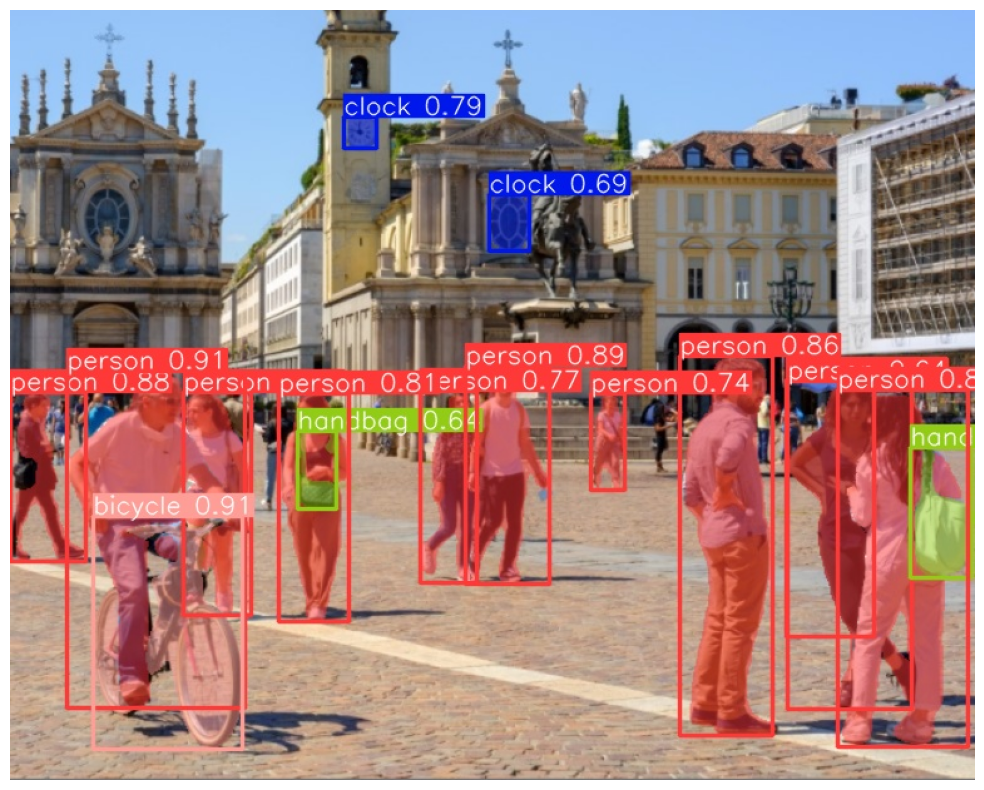

In [28]:
# mostrar imagem segmentada
# criação da função para mostrar as imagens geradas
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16,10)
  plt.axis('off')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()
resultado = cv2.imread('/content/runs/segment/predict2/italia.jpg')
mostrar(resultado)